In [61]:
import os
os.chdir('/rd2/user/xiacr/sle/other_sc_data/')
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import importlib

import glob
import anndata as ad
import collections

import scanpy.external as sce
from mycolorpy import colorlist as mcp

import utils
importlib.reload(utils)

<module 'utils' from '/rd2/user/xiacr/sle/other_sc_data/utils.py'>

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=160, facecolor='white', fontsize=10)
sc._settings.ScanpyConfig.n_jobs = 36

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.19.0 scipy==1.8.0 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.13.1 python-igraph==0.9.9 pynndescent==0.5.5


In [18]:
bcell = sc.read_h5ad('./output/03-bcell_raw.h5ad')
bcell = bcell.raw.to_adata()

In [ ]:
bcell = utils.do_harmony(bcell,hvg_batch=False,max_iter_harmony=20,theta=2)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/home/xiacr/miniconda3/envs/sle/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)


/home/xiacr/miniconda3/envs/sle/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [32]:
bcell.obs

,orig.ident,nCount_RNA,nFeature_RNA,group,treatment,pair,percent_mito,percent_ribo,S.Score,G2M.Score,...,study_disease,cell_type,batch,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,main_type_order
CGTTAGAGTCATACTG-1_9-0,MXY,2840.0,1255,sle_flare,untreated,unpaired,1.654930,18.063380,0.067411,0.297473,...,NaN,NaN,0,1146,1146,2296.0,47.0,2.047038,2,Bcell
ACTGCTCAGGGCTCTC-1_11-0,SQ,9547.0,2773,sle_flare,untreated,unpaired,0.481827,19.566356,0.066789,0.831009,...,NaN,NaN,0,2487,2487,8611.0,46.0,0.534200,2,Bcell
ACGGGCTGTTACGTCA-1_12-0,WYF,5042.0,2168,sle_flare,untreated,WYF_pair,1.051170,22.253074,0.269938,0.071442,...,NaN,NaN,0,1993,1993,4758.0,53.0,1.113913,3,Bcell
TATCTCAGTCTGGTCG-1_12-0,WYF,4934.0,2254,sle_flare,untreated,WYF_pair,1.743008,15.301986,0.479406,0.103852,...,NaN,NaN,0,2074,2074,4624.0,86.0,1.859862,3,Bcell
GCGCCAAAGCGGATCA-1_17-0,XYY2,10022.0,3454,sle_treated,treated,XH_pair,1.636400,23.697865,0.256812,0.109666,...,NaN,NaN,0,3111,3111,9324.0,164.0,1.758902,3,Bcell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCACGAGCGAAG-1_5-6,stim_IFNbeta,1218.0,539,IFNbeta_stim,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6,508,508,1184.0,0.0,0.000000,0,Bcell
TTTCAGTGCCAAGT-1_5-6,stim_IFNbeta,997.0,494,IFNbeta_stim,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6,461,461,955.0,0.0,0.000000,1,Bcell
TTTGACTGGCGAAG-1_5-6,stim_IFNbeta,2204.0,759,IFNbeta_stim,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6,712,712,2141.0,0.0,0.000000,2,Bcell
TTTGACTGGGTACT-1_5-6,stim_IFNbeta,1123.0,507,IFNbeta_stim,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6,484,484,1098.0,0.0,0.000000,1,Bcell


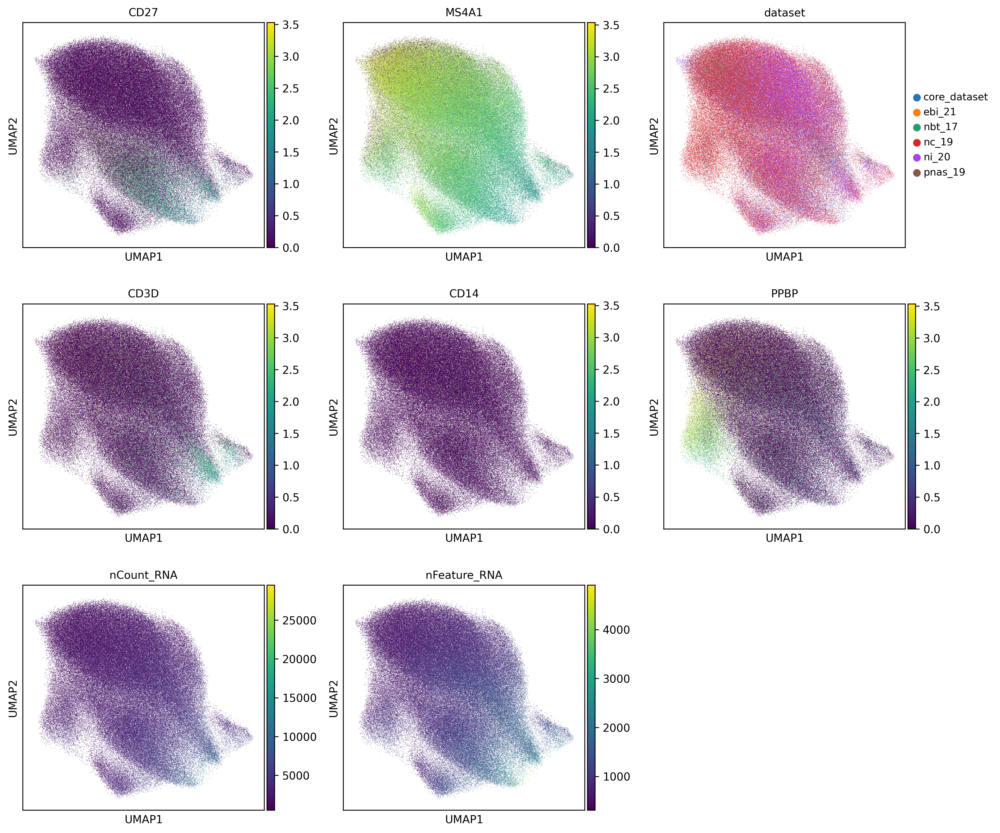

In [ ]:
sc.pl.umap(bcell,color=['CD27','MS4A1','dataset','CD3D','CD14','PPBP','nCount_RNA','nFeature_RNA'],ncols=3)

In [83]:
# if bcell.obs.dtypes == 'object'
tmp  = bcell.obs.loc[:,(bcell.obs.dtypes != object).tolist()]
# (bcell.obs.dtypes == object).tolist()

In [84]:
tmp

,orig.ident,nCount_RNA,nFeature_RNA,group,treatment,pair,percent_mito,percent_ribo,S.Score,G2M.Score,...,study_disease,cell_type,batch,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,main_type_order
CGTTAGAGTCATACTG-1_9-0,MXY,2840.0,1255,sle_flare,untreated,unpaired,1.654930,18.063380,0.067411,0.297473,...,NaN,NaN,0,1146,1146,2296.0,47.0,2.047038,2,Bcell
ACTGCTCAGGGCTCTC-1_11-0,SQ,9547.0,2773,sle_flare,untreated,unpaired,0.481827,19.566356,0.066789,0.831009,...,NaN,NaN,0,2487,2487,8611.0,46.0,0.534200,2,Bcell
ACGGGCTGTTACGTCA-1_12-0,WYF,5042.0,2168,sle_flare,untreated,WYF_pair,1.051170,22.253074,0.269938,0.071442,...,NaN,NaN,0,1993,1993,4758.0,53.0,1.113913,3,Bcell
TATCTCAGTCTGGTCG-1_12-0,WYF,4934.0,2254,sle_flare,untreated,WYF_pair,1.743008,15.301986,0.479406,0.103852,...,NaN,NaN,0,2074,2074,4624.0,86.0,1.859862,3,Bcell
GCGCCAAAGCGGATCA-1_17-0,XYY2,10022.0,3454,sle_treated,treated,XH_pair,1.636400,23.697865,0.256812,0.109666,...,NaN,NaN,0,3111,3111,9324.0,164.0,1.758902,3,Bcell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCACGAGCGAAG-1_5-6,stim_IFNbeta,1218.0,539,IFNbeta_stim,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6,508,508,1184.0,0.0,0.000000,0,Bcell
TTTCAGTGCCAAGT-1_5-6,stim_IFNbeta,997.0,494,IFNbeta_stim,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6,461,461,955.0,0.0,0.000000,1,Bcell
TTTGACTGGCGAAG-1_5-6,stim_IFNbeta,2204.0,759,IFNbeta_stim,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6,712,712,2141.0,0.0,0.000000,2,Bcell
TTTGACTGGGTACT-1_5-6,stim_IFNbeta,1123.0,507,IFNbeta_stim,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6,484,484,1098.0,0.0,0.000000,1,Bcell


In [71]:
df = [col_name for col_name in bcell.obs.columns if bcell.obs[col_name].dtypes != 'object']
# for col_name in bcell.obs.columns if bcell.obs[col_name].dtypes == 'object':
    # print(col_name)

In [72]:
df

['orig.ident',
 'nCount_RNA',
 'nFeature_RNA',
 'group',
 'treatment',
 'pair',
 'percent_mito',
 'percent_ribo',
 'S.Score',
 'G2M.Score',
 'Phase',
 'old.ident',
 'RNA_snn_res.0.8',
 'RNA_snn_res.1',
 'seurat_clusters',
 'main_type',
 'scrublet_doublet',
 'subtype',
 'RNA_snn_res.0.6',
 'RNA_snn_res.1.2',
 'RNA_snn_res.0.2',
 'RNA_snn_res.0.3',
 'RNA_snn_res.0.4',
 'RNA_snn_res.0.5',
 'barcode',
 'dataset',
 'sample',
 'X',
 'index',
 'suffix',
 'value',
 'Run',
 'BioSample',
 'biospecimen_repository_sample_id',
 'Bytes',
 'Center.Name',
 'Consent_Code',
 'Consent',
 'DATASTORE.filetype',
 'DATASTORE.provider',
 'DATASTORE.region',
 'Experiment',
 'Library.Name',
 'Sample.Name',
 'sex',
 'submitted_subject_id',
 'subject_is_affected',
 'AvgSpotLen',
 'Bases',
 'study_disease',
 'cell_type',
 'batch',
 'n_genes',
 'n_genes_by_counts',
 'total_counts',
 'total_counts_mt',
 'pct_counts_mt',
 'leiden',
 'main_type_order']

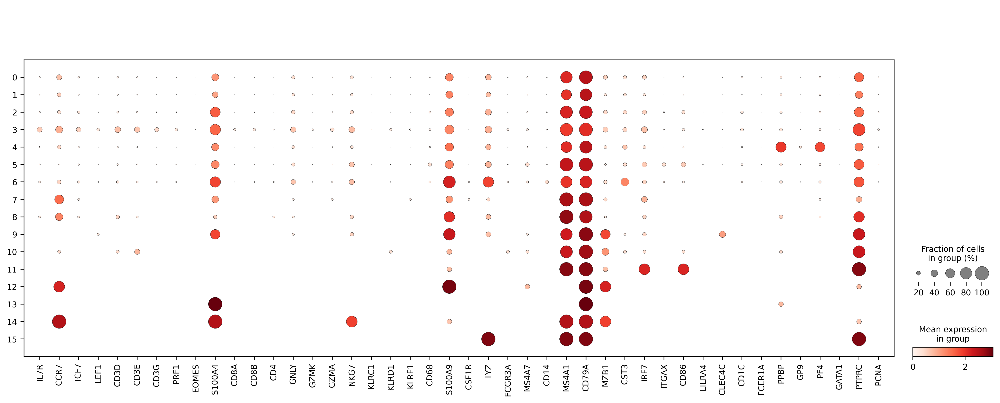

In [64]:
marker_list = [i for i in utils.marker_list if i in bcell.raw.var_names]
sc.pl.dotplot(bcell, marker_list, groupby='leiden');